# Preparación de Entorno 

In [1]:
# Instalando librerias 

### Web scraping y manipulación de archivos pdf
import requests 
import bs4
from bs4 import BeautifulSoup
import PyPDF2 
from PyPDF2 import PdfReader

### NPL 
import spacy

### Dataframes y transformaciones 
import pandas as pd

### Visualización 
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Obtención de Datos

In [2]:
# Código de respuesta - WARNING

url_ipcc = 'https://www.ipcc.ch/report/ar6/wg2/'

def status_code_url(url):
    r=requests.get(url)
    if r.status_code == 200:
        s=BeautifulSoup(r.text, 'lxml')
    else:
        print("error: No es correcto el status")
    return s

s = status_code_url(url_ipcc)
print(s)

<!DOCTYPE html>
<html lang="en"><head><meta charset="utf-8"/><meta content="ie=edge" http-equiv="x-ua-compatible"/><meta content="width=device-width, initial-scale=1, shrink-to-fit=no" name="viewport"/><meta content="summary_large_image" data-react-helmet="true" name="twitter:card"/><meta content="300" data-react-helmet="true" property="og:image:height"/><meta content="400" data-react-helmet="true" property="og:image:width"/><meta content="https://ipcc.ch/static/frontcover-90eca4d69c523f78eba99330720461e3.jpg" data-react-helmet="true" property="og:image"/><meta content="Intergovernmental Panel on Climate Change Working Group II contribution to the Sixth Assessment Report" data-react-helmet="true" name="twitter:description"/><meta content="Climate Change 2022: Impacts, Adaptation and Vulnerability" data-react-helmet="true" name="twitter:title"/><meta content="@ipcc" data-react-helmet="true" name="twitter:creator"/><meta content="website" data-react-helmet="true" property="og:type"/><met

In [ ]:
# Obtención de los reportes IPCC 

def get_report_url(report_num):
    return f"https://www.ipcc.ch/report/ar6/wg2/downloads/report/IPCC_AR6_WGII_Chapter{str(report_num).zfill(2)}.pdf"

def save_reports_ipcc(url, i):
    try:
        r = requests.get(url)
        if r.status_code == 200:
            with open(f'..Data/report{str(i).zfill(2)}.pdf', 'wb') as file:
                file.write(r.content)
            print(f'Reporte {i} descargado con éxito.')
        else:
            print(f'Error al descargar el reporte {i}: Status Code {r.status_code}')
    except Exception as e:
        print(f'Error al descargar el reporte {i}: {e}')

def download_all_reports():
    for i in range(1, 19):  
        url = get_report_url(i)
        print(f'Descargando reporte: {i} desde {url}')
        save_reports_ipcc(url, i)

# Llamar a la función para descargar todos los reportes
download_all_reports()


# Análisis Exploratorio

In [18]:
import os

# Verifica si el archivo existe
if os.path.exists("..Data/report01.pdf"):
    print("El archivo existe")
else:
    print("El archivo no existe")

# Obtén la ruta absoluta del archivo
ruta_absoluta = os.path.abspath("..Data/report01.pdf")
print(ruta_absoluta)


El archivo no existe
/Users/lilijohana/Desktop/Escritorio - Mac mini/PROYECTOS ML/NPL/Notebook/..Data/report01.pdf


In [30]:
# Report 11. Central and South America 

# Conteo de páginas 
report1_pdf = open("../Data/report01.pdf", "rb") 
pdf_reader = PyPDF2.PdfFileReader(report1_pdf)
print(pdf_reader.getNumPages())


Xref table not zero-indexed. ID numbers for objects will be corrected.


78


# Transformación y Análisis

In [31]:
# Convirtiendo pdf a txt   

pdf_reader = PdfReader("../Data/report01.pdf")
text_file_txt = ""
for page in pdf_reader.pages:
    text_file_txt += page.extract_text() + "\n"
    print(text_file_txt)

Chapters and  
Cross-Chapter Papers

Chapters and  
Cross-Chapter Papers


Chapters and  
Cross-Chapter Papers

SPM121
1
Point of Departure 
and Key Concepts
Coordinating Lead Authors: Rawshan Ara Begum (Malaysia/Australia/Bangladesh) and Robert 
J. Lempert (USA)
Lead Authors: Elham Ali (Egypt), Tor Arve Benjaminsen (Norway), Thomas Bernauer (Switzerland), 
Wolfgang Cramer (France/Germany), Xuefeng Cui (China), Katharine Mach (USA), Gustavo Nagy 
(Uruguay), Nils Christian Stenseth (Norway), Raman Sukumar (India), and Philippus Wester 
(Nepal/the Netherlands)
Contributing Authors: Maarten van Aalst (Netherlands), Gusti Anshari (Indonesia), Richard Betts 
(UK), Edward R. Carr (USA), Vanesa Castán Broto (UK), Connor J. Cavanagh (Norway), Eva Davidsdottir 
(Norway), Greg Flato (Canada), Katja Frieler (Germany), Nathan Gillett (Canada/UK), Lorena B. 
Gonzalez (Mexico), Marjolin Haasnoot (the Netherlands), Jo S Hermansen (Norway), Pandora Hope 
(Australia), Christian Huggel (Switzerland), Da

In [ ]:
# Longitud del archivo en caracteres


len(text_file_txt)

666186

In [ ]:
# Conteo de párrafos

nlp = spacy.load("en_core_web_sm") # Instanciar Spacy
doc_report = nlp(text_file_txt)    # Variable recibiebndo la instancia de SpaCy con nuestro archivo como argumento


for index, sentences in enumerate(doc_report.sents): # Se recorre la instancia 
    print(f'{index}: {sentences}') 

 #7666 Párrafos. Se cuentan los párrafos a partir del .                        

##### 2. Anotaciones Linguisticas 

In [ ]:
# Anotaciones linguisticas

from tokenize import Token

for token in doc_report:
    token_text = token.text
    token_pos = token.pos_
    token_tag = token.tag_
    token_dep = token.dep_
    token_lemma = token.lemma_
    token_shape = token.shape_

    print(f"{token_text:>12}{token_lemma:>12}{token_pos:>12}{token_tag:>12}{token_dep:>12}{token_shape:>12}")


In [ ]:
# Explicación de las anotaciones 

#spacy.explain('GPE')
spacy.explain('PROPN')

'proper noun'

In [ ]:
# Top palabras usando el paquete de SpaCy Counter

from collections import Counter 

words_in_doc_report = [token.text.lower() for token in doc_report      # Se estandarizan las palabras, todas en minusculas
 if not token.is_stop and not token.is_punct  and not token.is_space]
counter_words_report = Counter(words_in_doc_report)
top_counter_words_report = counter_words_report.most_common(50)
print(top_counter_words_report)


[('�', 2237), ('al', 1878), ('et', 1877), ('climate', 1257), ('change', 918), ('australia', 752), ('adaptation', 637), ('new', 616), ('2018', 546), ('j.', 538), ('2020', 525), ('2019', 523), ('zealand', 519), ('2016', 393), ('2017', 393), ('water', 358), ('impacts', 346), ('m.', 308), ('2015', 302), ('australian', 301), ('a.', 299), ('high', 295), ('s.', 282), ('risk', 279), ('confidence', 264), ('2014', 258), ('available', 244), ('2021', 240), ('projected', 222), ('r.', 221), ('management', 214), ('11', 213), ('coastal', 205), ('d.', 204), ('c.', 196), ('risks', 180), ('extreme', 180), ('1', 178), ('doi:10.1016', 176), ('sea', 175), ('species', 168), ('p', 167), ('b.', 165), ('l.', 165), ('national', 163), ('planning', 162), ('rainfall', 159), ('table', 156), ('2', 154), ('health', 153)]


### Dataframe y Visualización

In [ ]:
# Top words en Dataframe para realizar transformaciones

df_top_words_in_report = pd.DataFrame(words_in_doc_report)
df_top_words_in_report.columns = ["Top_Words"]

df_top_words_in_report

,Top_Words
0,spm1581
1,11
2,australasia
3,chapter
4,cited
...,...
74150,austral
74151,ecology
74152,43
74153,5


In [ ]:
# limpieza de datos 

df_top_words_in_report = df_top_words_in_report.loc[df_top_words_in_report['Top_Words'] != "al", :] 
df_top_words_in_report = df_top_words_in_report.loc[df_top_words_in_report['Top_Words'] != "et", :]
df_top_words_in_report = df_top_words_in_report.loc[df_top_words_in_report['Top_Words'] != "doi:10.1016", :]
df_top_words_in_report = df_top_words_in_report.loc[df_top_words_in_report['Top_Words'] != "spm1689", :]
df_top_words_in_report = df_top_words_in_report.loc[df_top_words_in_report['Top_Words'] != "j.wre.2021.100176", :]

df_top_words_in_report

,Top_Words
0,spm1581
1,11
2,australasia
3,chapter
4,cited
...,...
74150,austral
74151,ecology
74152,43
74153,5


In [ ]:
# Cambiando de dataframe a str para visualizar la data

str_top_words_df = df_top_words_in_report.to_string(index=False)

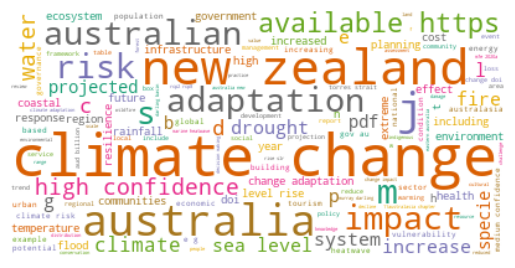

In [ ]:
# Visualización frecuencia de palabras 

wordcloud = WordCloud(max_font_size=100, background_color="white", colormap="Dark2").generate(str_top_words_df)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [ ]:
# Retornar oraciones con las palabras mas frecuentes 

from spacy.matcher import Matcher # Se importa el paquete Matcher de SpaCy

test_doc= nlp(doc_report)         # Le pasamos nuestro archivo a nuestra instancia y se crea una variable 

pattern = [{"TEXT": "Colombia"}]  # Lista de diccionario con los parametros a buscar. En este caso, la palabra Colombia


matcher = Matcher(nlp.vocab)      # Con "QUOTE" obtengo las frases que contengan Colombia y lo alamacena en una variable 
matcher.add("QUOTE", [pattern])


for match_id, start, end in matcher(test_doc):                          # Recorre la variable para retornar las coincidencias
    test = test_doc.vocab.strings[match_id], test_doc[start:end].sent
    print(test)